In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

2024-11-02 13:13:13.036561: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-02 13:13:13.045317: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-02 13:13:13.055075: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-02 13:13:13.058154: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-02 13:13:13.066181: I tensorflow/core/platform/cpu_feature_guar

In [2]:
# !pip install kaggle

error: externally-managed-environment

× This environment is externally managed
╰─> To install Python packages system-wide, try apt install
    python3-xyz, where xyz is the package you are trying to
    install.
    
    If you wish to install a non-Debian-packaged Python package,
    create a virtual environment using python3 -m venv path/to/venv.
    Then use path/to/venv/bin/python and path/to/venv/bin/pip. Make
    sure you have python3-full installed.
    
    If you wish to install a non-Debian packaged Python application,
    it may be easiest to use pipx install xyz, which will manage a
    virtual environment for you. Make sure you have pipx installed.
    
    See /usr/share/doc/python3.12/README.venv for more information.

note: If you believe this is a mistake, please contact your Python installation or OS distribution provider. You can override this, at the risk of breaking your Python installation or OS, by passing --break-system-packages.
hint: See PEP 668 for the detai

In [ ]:
# !kaggle datasets download -d obulisainaren/multi-cancer

In [1]:
# %ls

MobileNet_V1.ipynb  multi-cancer.zip


In [2]:
# !unzip multi-cancer.zip

Archive:  multi-cancer.zip
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0001.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0002.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0003.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0004.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0005.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0006.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0007.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0008.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0009.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0010.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0011.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0012.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_ben

# Data preprocessing

In [3]:
import tensorflow as tf
import os

DATASET_DIR = 'aug_dataset' 

# Đường dẫn tới các thư mục lớp
class_names = ['High squamous intra-epithelial lesion', 'Low squamous intra-epithelial lesion', 'Negative for Intraepithelial malignancy', 'Squamous cell carcinoma']
data_dir = os.path.join(DATASET_DIR)

BATCH_SIZE = 64
IMG_SIZE = (224, 224)

# Tạo dataset cho training và validation
train_dataset = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2, 
    subset="training",    
    seed=123,              
    shuffle=True,
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    label_mode='categorical'
)

validation_dataset = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,  
    subset="validation",   
    seed=123,              
    shuffle=True,
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    label_mode='categorical'
)


Found 11544 files belonging to 4 classes.
Using 9236 files for training.
Found 11544 files belonging to 4 classes.
Using 2308 files for validation.


I0000 00:00:1730528306.330154  186877 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-11-02 13:18:26.354700: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2343] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [293]:
# _URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'
# path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)
# PATH = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

# train_dir = os.path.join(PATH, 'train')
# validation_dir = os.path.join(PATH, 'validation')

# BATCH_SIZE = 32
# IMG_SIZE = (160, 160)

# train_dataset = tf.keras.utils.image_dataset_from_directory(train_dir,
#                                                             shuffle=True,
#                                                             batch_size=BATCH_SIZE,
#                                                             image_size=IMG_SIZE)

In [4]:
val_batches = tf.data.experimental.cardinality(validation_dataset)
test_dataset = validation_dataset.take(max(1, val_batches // 5))
validation_dataset = validation_dataset.skip(max(1, val_batches // 5))

In [5]:
print('Number of validation batches: %d' % tf.data.experimental.cardinality(validation_dataset))
print('Number of test batches: %d' % tf.data.experimental.cardinality(test_dataset))

Number of validation batches: 30
Number of test batches: 7


In [296]:
# # Split data
# val_batches = tf.data.experimental.cardinality(validation_dataset)
# test_dataset = validation_dataset.take(val_batches // 5)
# validation_dataset = validation_dataset.skip(val_batches // 5)

In [297]:
# print('Number of validation batches: %d' % tf.data.experimental.cardinality(validation_dataset))
# print('Number of test batches: %d' % tf.data.experimental.cardinality(test_dataset))

# Configure the dataset for performance

In [6]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

# Use data augmentation

In [299]:
# data_augmentation = tf.keras.Sequential([
#   tf.keras.layers.RandomFlip('horizontal'),
#   tf.keras.layers.RandomRotation(0.2),
# ])

In [300]:
# for image, _ in train_dataset.take(1):
#   plt.figure(figsize=(10, 10))
#   first_image = image[0]
#   for i in range(9):
#     ax = plt.subplot(3, 3, i + 1)
#     augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
#     plt.imshow(augmented_image[0] / 255)
#     plt.axis('off')

# Rescale pixel values

In [7]:
# Thay preprocess_input của EfficientNetB0
preprocess_input = tf.keras.applications.efficientnet.preprocess_input

In [8]:
rescale = tf.keras.layers.Rescaling(1./127.5, offset=-1) # [-1, 1] or [0, 1]

# Create the base model from the pre-trained convnets

In [9]:

# Create the base model from the pre-trained model MobileNet
IMG_SHAPE = IMG_SIZE + (3,)
base_model = tf.keras.applications.EfficientNetB0(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

In [10]:
image_batch, label_batch = next(iter(train_dataset))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(64, 7, 7, 1024)


# Feature extraction

## Freeze the convolutional base

In [11]:
base_model.trainable = False

In [12]:
base_model.summary()

Model: "mobilenet_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 112, 112, 32)   │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_bn (BatchNormalization)   │ (None, 112, 112, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_relu (ReLU)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1 (DepthwiseConv2D)     │ (None, 112, 112, 32)   │           288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_bn                    │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_relu (ReLU)           │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1 (Conv2D)              │ (None, 112, 112, 64)   │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_bn                    │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_relu (ReLU)           │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pad_2 (ZeroPadding2D)      │ (None, 113, 113, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2 (DepthwiseConv2D)     │ (None, 56, 56, 64)     │           576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_bn                    │ (None, 56, 56, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_relu (ReLU)           │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2 (Conv2D)              │ (None, 56, 56, 128)    │         8,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_relu (ReLU)           │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3 (DepthwiseConv2D)     │ (None, 56, 56, 128)    │         1,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_relu (ReLU)           │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3 (Conv2D)              │ (None, 56, 56, 128)    │        16,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │             

 Total params: 3,228,864 (12.32 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 3,228,864 (12.32 MB)

## Add a classification head

In [13]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(64, 1024)


In [14]:
prediction_layer = tf.keras.layers.Dense(4, activation='softmax')
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(64, 4)


In [15]:
inputs = tf.keras.Input(shape=(224, 224, 3))
# x = data_augmentation(inputs)
x = preprocess_input(inputs)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

In [16]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,232,964 (12.33 MB)

 Trainable params: 4,100 (16.02 KB)

 Non-trainable params: 3,228,864 (12.32 MB)

In [17]:
len(model.trainable_variables)

2

In [18]:
# tf.keras.utils.plot_model(model, show_shapes=True)

## Compile the model

In [19]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(),  # Hoặc SparseCategoricalCrossentropy
              metrics=[tf.keras.metrics.CategoricalAccuracy(name='accuracy')])  # Hoặc SparseCategoricalAccuracy

## Train the model

In [20]:
initial_epochs = 100

loss0, accuracy0 = model.evaluate(validation_dataset)

30/30 ━━━━━━━━━━━━━━━━━━━━ 18s 439ms/step - accuracy: 0.3486 - loss: 1.3783


In [21]:
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

initial loss: 1.38
initial accuracy: 0.36


In [22]:
early_stopping = EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,        
    patience=5,             
    verbose=1,             
    mode='auto',
    restore_best_weights=True 
)

In [23]:

history = model.fit(train_dataset,
                    epochs=initial_epochs,
                    validation_data=validation_dataset,
                    callbacks=[early_stopping])

Epoch 1/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step - accuracy: 0.5439 - loss: 1.1277

2024-11-02 13:22:34.763200: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 80s 544ms/step - accuracy: 0.5445 - loss: 1.1266 - val_accuracy: 0.7253 - val_loss: 0.7218
Epoch 2/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.7162 - loss: 0.7444

2024-11-02 13:23:48.078737: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 507ms/step - accuracy: 0.7164 - loss: 0.7440 - val_accuracy: 0.7909 - val_loss: 0.5597
Epoch 3/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step - accuracy: 0.7721 - loss: 0.5937

2024-11-02 13:25:01.861414: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 74s 509ms/step - accuracy: 0.7722 - loss: 0.5935 - val_accuracy: 0.8280 - val_loss: 0.4548
Epoch 4/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step - accuracy: 0.8099 - loss: 0.4936

2024-11-02 13:26:15.450411: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 74s 508ms/step - accuracy: 0.8099 - loss: 0.4935 - val_accuracy: 0.8618 - val_loss: 0.3968
Epoch 5/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.8330 - loss: 0.4430

2024-11-02 13:27:28.767644: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.8330 - loss: 0.4428 - val_accuracy: 0.8812 - val_loss: 0.3545
Epoch 6/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step - accuracy: 0.8505 - loss: 0.3969

2024-11-02 13:28:43.203184: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 74s 514ms/step - accuracy: 0.8505 - loss: 0.3967 - val_accuracy: 0.8962 - val_loss: 0.3228
Epoch 7/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.8647 - loss: 0.3607

2024-11-02 13:29:56.430230: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 505ms/step - accuracy: 0.8647 - loss: 0.3606 - val_accuracy: 0.9075 - val_loss: 0.3003
Epoch 8/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.8744 - loss: 0.3388

2024-11-02 13:31:09.923736: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 507ms/step - accuracy: 0.8744 - loss: 0.3387 - val_accuracy: 0.9183 - val_loss: 0.2782
Epoch 9/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.8885 - loss: 0.3174

2024-11-02 13:32:23.209341: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.8886 - loss: 0.3173 - val_accuracy: 0.9258 - val_loss: 0.2607
Epoch 10/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.8983 - loss: 0.2931

2024-11-02 13:33:36.435988: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 505ms/step - accuracy: 0.8983 - loss: 0.2931 - val_accuracy: 0.9301 - val_loss: 0.2478
Epoch 11/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.9027 - loss: 0.2775

2024-11-02 13:34:49.882209: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 507ms/step - accuracy: 0.9027 - loss: 0.2774 - val_accuracy: 0.9360 - val_loss: 0.2308
Epoch 12/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.8998 - loss: 0.2748

2024-11-02 13:36:03.097431: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 505ms/step - accuracy: 0.8998 - loss: 0.2747 - val_accuracy: 0.9398 - val_loss: 0.2175
Epoch 13/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step - accuracy: 0.9146 - loss: 0.2509

2024-11-02 13:37:16.598184: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 507ms/step - accuracy: 0.9146 - loss: 0.2509 - val_accuracy: 0.9414 - val_loss: 0.2119
Epoch 14/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9173 - loss: 0.2424

2024-11-02 13:38:29.843234: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 505ms/step - accuracy: 0.9173 - loss: 0.2424 - val_accuracy: 0.9446 - val_loss: 0.2030
Epoch 15/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9186 - loss: 0.2351

2024-11-02 13:39:43.108398: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9187 - loss: 0.2350 - val_accuracy: 0.9473 - val_loss: 0.1956
Epoch 16/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.9186 - loss: 0.2309

2024-11-02 13:40:56.639959: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 507ms/step - accuracy: 0.9186 - loss: 0.2308 - val_accuracy: 0.9468 - val_loss: 0.1924
Epoch 17/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9284 - loss: 0.2134

2024-11-02 13:42:09.899039: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9284 - loss: 0.2133 - val_accuracy: 0.9505 - val_loss: 0.1834
Epoch 18/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9307 - loss: 0.2090 - val_accuracy: 0.9527 - val_loss: 0.1762
Epoch 19/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 505ms/step - accuracy: 0.9319 - loss: 0.1986 - val_accuracy: 0.9538 - val_loss: 0.1719
Epoch 20/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 507ms/step - accuracy: 0.9370 - loss: 0.1954 - val_accuracy: 0.9570 - val_loss: 0.1646
Epoch 21/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 505ms/step - accuracy: 0.9332 - loss: 0.1935 - val_accuracy: 0.9559 - val_loss: 0.1605
Epoch 22/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 505ms/step - accuracy: 0.9426 - loss: 0.1855 - val_accuracy: 0.9565 - val_loss: 0.1530
Epoch 23/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9427 - loss: 0.1816 - val_accuracy: 0.9597 - val_loss: 0.1492
Epoch 24/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 507ms/step - accuracy: 0.9451 - loss

2024-11-02 13:59:16.268395: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 82s 563ms/step - accuracy: 0.9510 - loss: 0.1468 - val_accuracy: 0.9656 - val_loss: 0.1255
Epoch 32/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9581 - loss: 0.1430

2024-11-02 14:00:37.696630: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 505ms/step - accuracy: 0.9581 - loss: 0.1430 - val_accuracy: 0.9683 - val_loss: 0.1256
Epoch 33/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9546 - loss: 0.1419

2024-11-02 14:01:50.962111: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 505ms/step - accuracy: 0.9546 - loss: 0.1419 - val_accuracy: 0.9710 - val_loss: 0.1181
Epoch 34/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.9562 - loss: 0.1381

2024-11-02 14:03:04.369832: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 507ms/step - accuracy: 0.9562 - loss: 0.1381 - val_accuracy: 0.9704 - val_loss: 0.1156
Epoch 35/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 505ms/step - accuracy: 0.9560 - loss: 0.1383 - val_accuracy: 0.9726 - val_loss: 0.1121
Epoch 36/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9580 - loss: 0.1353 - val_accuracy: 0.9737 - val_loss: 0.1142
Epoch 37/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.9565 - loss: 0.1331

2024-11-02 14:06:44.237197: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 507ms/step - accuracy: 0.9565 - loss: 0.1330 - val_accuracy: 0.9720 - val_loss: 0.1128
Epoch 38/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step - accuracy: 0.9585 - loss: 0.1303

2024-11-02 14:07:57.419053: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 505ms/step - accuracy: 0.9586 - loss: 0.1303 - val_accuracy: 0.9758 - val_loss: 0.1100
Epoch 39/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9594 - loss: 0.1267

2024-11-02 14:09:10.660185: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9594 - loss: 0.1267 - val_accuracy: 0.9753 - val_loss: 0.1071
Epoch 40/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.9618 - loss: 0.1239

2024-11-02 14:10:24.157358: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9618 - loss: 0.1239 - val_accuracy: 0.9785 - val_loss: 0.1033
Epoch 41/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9608 - loss: 0.1262

2024-11-02 14:11:37.379804: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 505ms/step - accuracy: 0.9608 - loss: 0.1261 - val_accuracy: 0.9753 - val_loss: 0.1029
Epoch 42/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9653 - loss: 0.1209

2024-11-02 14:12:50.702006: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9653 - loss: 0.1209 - val_accuracy: 0.9780 - val_loss: 0.1010
Epoch 43/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9630 - loss: 0.1220

2024-11-02 14:14:04.049072: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9630 - loss: 0.1219 - val_accuracy: 0.9780 - val_loss: 0.1010
Epoch 44/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9640 - loss: 0.1142

2024-11-02 14:15:17.349891: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9640 - loss: 0.1142 - val_accuracy: 0.9785 - val_loss: 0.0981
Epoch 45/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step - accuracy: 0.9613 - loss: 0.1155

2024-11-02 14:16:30.846167: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 507ms/step - accuracy: 0.9613 - loss: 0.1155 - val_accuracy: 0.9796 - val_loss: 0.0970
Epoch 46/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9638 - loss: 0.1148

2024-11-02 14:17:44.167412: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9638 - loss: 0.1148 - val_accuracy: 0.9806 - val_loss: 0.0979
Epoch 47/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9649 - loss: 0.1164

2024-11-02 14:18:57.484894: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9649 - loss: 0.1164 - val_accuracy: 0.9806 - val_loss: 0.0959
Epoch 48/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.9657 - loss: 0.1121

2024-11-02 14:20:10.917778: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 507ms/step - accuracy: 0.9658 - loss: 0.1121 - val_accuracy: 0.9796 - val_loss: 0.0933
Epoch 49/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9657 - loss: 0.1139

2024-11-02 14:21:24.187248: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 505ms/step - accuracy: 0.9657 - loss: 0.1139 - val_accuracy: 0.9823 - val_loss: 0.0890
Epoch 50/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9640 - loss: 0.1114

2024-11-02 14:22:37.484430: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9640 - loss: 0.1114 - val_accuracy: 0.9785 - val_loss: 0.0916
Epoch 51/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.9631 - loss: 0.1099

2024-11-02 14:23:50.912465: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 507ms/step - accuracy: 0.9631 - loss: 0.1098 - val_accuracy: 0.9812 - val_loss: 0.0895
Epoch 52/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.9682 - loss: 0.1022

2024-11-02 14:25:04.216376: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9682 - loss: 0.1022 - val_accuracy: 0.9796 - val_loss: 0.0901
Epoch 53/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9678 - loss: 0.1047

2024-11-02 14:26:17.480870: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 505ms/step - accuracy: 0.9677 - loss: 0.1047 - val_accuracy: 0.9823 - val_loss: 0.0874
Epoch 54/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.9677 - loss: 0.1037

2024-11-02 14:27:30.931212: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 507ms/step - accuracy: 0.9677 - loss: 0.1037 - val_accuracy: 0.9812 - val_loss: 0.0883
Epoch 55/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9672 - loss: 0.1047

2024-11-02 14:28:44.190172: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9672 - loss: 0.1046 - val_accuracy: 0.9833 - val_loss: 0.0846
Epoch 56/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9649 - loss: 0.1072

2024-11-02 14:29:57.519351: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 81s 563ms/step - accuracy: 0.9649 - loss: 0.1072 - val_accuracy: 0.9812 - val_loss: 0.0848
Epoch 57/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.9689 - loss: 0.0994

2024-11-02 14:31:19.141025: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9688 - loss: 0.0993 - val_accuracy: 0.9839 - val_loss: 0.0797
Epoch 58/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.9677 - loss: 0.1026

2024-11-02 14:32:32.463042: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9677 - loss: 0.1026 - val_accuracy: 0.9817 - val_loss: 0.0845
Epoch 59/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.9718 - loss: 0.0995

2024-11-02 14:33:45.827369: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 507ms/step - accuracy: 0.9718 - loss: 0.0995 - val_accuracy: 0.9817 - val_loss: 0.0834
Epoch 60/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9654 - loss: 0.1037

2024-11-02 14:34:59.227870: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9654 - loss: 0.1037 - val_accuracy: 0.9844 - val_loss: 0.0786
Epoch 61/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9661 - loss: 0.1011

2024-11-02 14:36:12.502467: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9661 - loss: 0.1010 - val_accuracy: 0.9833 - val_loss: 0.0801
Epoch 62/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.9677 - loss: 0.0961

2024-11-02 14:37:25.891887: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 507ms/step - accuracy: 0.9677 - loss: 0.0960 - val_accuracy: 0.9833 - val_loss: 0.0815
Epoch 63/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9727 - loss: 0.0932

2024-11-02 14:38:39.230605: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 506ms/step - accuracy: 0.9727 - loss: 0.0932 - val_accuracy: 0.9849 - val_loss: 0.0793
Epoch 64/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - accuracy: 0.9702 - loss: 0.0978

2024-11-02 14:40:01.164932: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 82s 506ms/step - accuracy: 0.9702 - loss: 0.0978 - val_accuracy: 0.9828 - val_loss: 0.0781
Epoch 65/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step - accuracy: 0.9747 - loss: 0.0901

2024-11-02 14:41:14.659457: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


145/145 ━━━━━━━━━━━━━━━━━━━━ 73s 507ms/step - accuracy: 0.9747 - loss: 0.0901 - val_accuracy: 0.9839 - val_loss: 0.0782
Epoch 65: early stopping
Restoring model weights from the end of the best epoch: 60.


In [24]:
actual_initial_epochs = len(history.epoch) 

In [25]:
actual_initial_epochs

65

## Learning curves

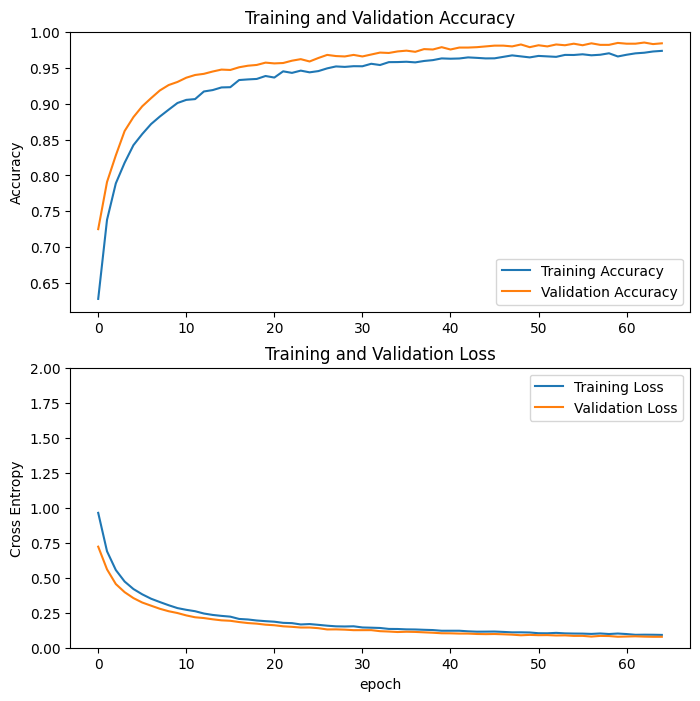

In [26]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,2.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

# Fine tuning

### Un-freeze the top layers of the model

In [27]:
base_model.trainable = True

In [28]:
print("Number of layers in the base model: ", len(base_model.layers))

# Fine-tune from this layer onwards
fine_tune_at = 143

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

Number of layers in the base model:  86


In [29]:
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),  # Hoặc tf.keras.losses.SparseCategoricalCrossentropy()
              optimizer=tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate/10),
              metrics=[tf.keras.metrics.CategoricalAccuracy(name='accuracy')])

In [30]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,232,964 (12.33 MB)

 Trainable params: 2,668,548 (10.18 MB)

 Non-trainable params: 564,416 (2.15 MB)

In [31]:
len(model.trainable_variables)   

37

In [32]:
# Set up callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',       
    patience=5,            
    verbose=1,               
    mode='auto',
    restore_best_weights=True 
)

# Save the model checkpoints
model_checkpoint = ModelCheckpoint(
    filepath='efficientNet_B0_Aug.keras',
    monitor='val_loss',
    verbose=1,             
    save_best_only=True,   
    save_weights_only=False, 
    mode='min',            
    save_freq='epoch'    
)

In [33]:
fine_tune_epochs = 100
total_epochs =  initial_epochs + fine_tune_epochs

history_fine = model.fit(train_dataset,
                         epochs=total_epochs,
                         initial_epoch=actual_initial_epochs,
                         validation_data=validation_dataset,
                         callbacks=[early_stopping, model_checkpoint])

Epoch 66/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 788ms/step - accuracy: 0.7491 - loss: 1.0640
Epoch 66: val_loss improved from inf to 0.21073, saving model to mobileNet_V1_Aug.keras
145/145 ━━━━━━━━━━━━━━━━━━━━ 133s 879ms/step - accuracy: 0.7496 - loss: 1.0610 - val_accuracy: 0.9215 - val_loss: 0.2107
Epoch 67/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 786ms/step - accuracy: 0.9490 - loss: 0.1554
Epoch 67: val_loss improved from 0.21073 to 0.07489, saving model to mobileNet_V1_Aug.keras
145/145 ━━━━━━━━━━━━━━━━━━━━ 127s 873ms/step - accuracy: 0.9491 - loss: 0.1553 - val_accuracy: 0.9742 - val_loss: 0.0749
Epoch 68/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 787ms/step - accuracy: 0.9679 - loss: 0.0884
Epoch 68: val_loss improved from 0.07489 to 0.04312, saving model to mobileNet_V1_Aug.keras
145/145 ━━━━━━━━━━━━━━━━━━━━ 127s 875ms/step - accuracy: 0.9679 - loss: 0.0883 - val_accuracy: 0.9844 - val_loss: 0.0431
Epoch 69/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 786ms/step - accuracy: 0.9846 - loss: 0.0467
Epoch

2024-11-02 14:51:55.748002: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 70: val_loss improved from 0.03142 to 0.02690, saving model to mobileNet_V1_Aug.keras
145/145 ━━━━━━━━━━━━━━━━━━━━ 127s 873ms/step - accuracy: 0.9888 - loss: 0.0345 - val_accuracy: 0.9914 - val_loss: 0.0269
Epoch 71/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 786ms/step - accuracy: 0.9960 - loss: 0.0167

2024-11-02 14:54:02.389374: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 71: val_loss improved from 0.02690 to 0.02198, saving model to mobileNet_V1_Aug.keras
145/145 ━━━━━━━━━━━━━━━━━━━━ 127s 873ms/step - accuracy: 0.9960 - loss: 0.0167 - val_accuracy: 0.9925 - val_loss: 0.0220
Epoch 72/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 786ms/step - accuracy: 0.9952 - loss: 0.0161

2024-11-02 14:56:09.018526: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 72: val_loss improved from 0.02198 to 0.01855, saving model to mobileNet_V1_Aug.keras
145/145 ━━━━━━━━━━━━━━━━━━━━ 127s 873ms/step - accuracy: 0.9952 - loss: 0.0161 - val_accuracy: 0.9930 - val_loss: 0.0186
Epoch 73/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 786ms/step - accuracy: 0.9971 - loss: 0.0104

2024-11-02 14:58:15.583957: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 73: val_loss improved from 0.01855 to 0.01733, saving model to mobileNet_V1_Aug.keras
145/145 ━━━━━━━━━━━━━━━━━━━━ 127s 874ms/step - accuracy: 0.9971 - loss: 0.0104 - val_accuracy: 0.9957 - val_loss: 0.0173
Epoch 74/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 785ms/step - accuracy: 0.9974 - loss: 0.0102

2024-11-02 15:00:22.203758: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 74: val_loss improved from 0.01733 to 0.01673, saving model to mobileNet_V1_Aug.keras
145/145 ━━━━━━━━━━━━━━━━━━━━ 135s 929ms/step - accuracy: 0.9974 - loss: 0.0102 - val_accuracy: 0.9952 - val_loss: 0.0167
Epoch 75/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 786ms/step - accuracy: 0.9978 - loss: 0.0078

2024-11-02 15:02:36.950209: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 75: val_loss did not improve from 0.01673
145/145 ━━━━━━━━━━━━━━━━━━━━ 126s 872ms/step - accuracy: 0.9978 - loss: 0.0078 - val_accuracy: 0.9946 - val_loss: 0.0171
Epoch 76/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 786ms/step - accuracy: 0.9987 - loss: 0.0056

2024-11-02 15:04:43.215023: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 76: val_loss improved from 0.01673 to 0.01586, saving model to mobileNet_V1_Aug.keras
145/145 ━━━━━━━━━━━━━━━━━━━━ 127s 873ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.9946 - val_loss: 0.0159
Epoch 77/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 786ms/step - accuracy: 0.9995 - loss: 0.0032

2024-11-02 15:06:49.846901: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 77: val_loss improved from 0.01586 to 0.01141, saving model to mobileNet_V1_Aug.keras
145/145 ━━━━━━━━━━━━━━━━━━━━ 127s 873ms/step - accuracy: 0.9995 - loss: 0.0032 - val_accuracy: 0.9952 - val_loss: 0.0114
Epoch 78/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 786ms/step - accuracy: 0.9996 - loss: 0.0030

2024-11-02 15:08:56.475693: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 78: val_loss did not improve from 0.01141
145/145 ━━━━━━━━━━━━━━━━━━━━ 126s 872ms/step - accuracy: 0.9996 - loss: 0.0030 - val_accuracy: 0.9968 - val_loss: 0.0128
Epoch 79/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 786ms/step - accuracy: 0.9998 - loss: 0.0028

2024-11-02 15:11:02.754082: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 79: val_loss did not improve from 0.01141
145/145 ━━━━━━━━━━━━━━━━━━━━ 126s 871ms/step - accuracy: 0.9998 - loss: 0.0028 - val_accuracy: 0.9968 - val_loss: 0.0125
Epoch 80/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 787ms/step - accuracy: 0.9997 - loss: 0.0024

2024-11-02 15:13:09.193256: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 80: val_loss did not improve from 0.01141
145/145 ━━━━━━━━━━━━━━━━━━━━ 126s 872ms/step - accuracy: 0.9997 - loss: 0.0024 - val_accuracy: 0.9962 - val_loss: 0.0121
Epoch 81/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 787ms/step - accuracy: 0.9999 - loss: 0.0016

2024-11-02 15:15:15.706729: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 81: val_loss did not improve from 0.01141
145/145 ━━━━━━━━━━━━━━━━━━━━ 127s 874ms/step - accuracy: 0.9999 - loss: 0.0016 - val_accuracy: 0.9973 - val_loss: 0.0119
Epoch 82/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 788ms/step - accuracy: 0.9992 - loss: 0.0026

2024-11-02 15:17:22.413291: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 82: val_loss improved from 0.01141 to 0.01010, saving model to mobileNet_V1_Aug.keras
145/145 ━━━━━━━━━━━━━━━━━━━━ 127s 875ms/step - accuracy: 0.9992 - loss: 0.0026 - val_accuracy: 0.9973 - val_loss: 0.0101
Epoch 83/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 847ms/step - accuracy: 0.9998 - loss: 0.0015

2024-11-02 15:19:37.963827: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 83: val_loss did not improve from 0.01010
145/145 ━━━━━━━━━━━━━━━━━━━━ 138s 955ms/step - accuracy: 0.9998 - loss: 0.0015 - val_accuracy: 0.9973 - val_loss: 0.0127
Epoch 84/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9997 - loss: 0.0022
Epoch 84: val_loss improved from 0.01010 to 0.00995, saving model to mobileNet_V1_Aug.keras
145/145 ━━━━━━━━━━━━━━━━━━━━ 190s 1s/step - accuracy: 0.9997 - loss: 0.0022 - val_accuracy: 0.9978 - val_loss: 0.0100
Epoch 85/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9997 - loss: 0.0011

2024-11-02 15:26:21.205350: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 85: val_loss did not improve from 0.00995
145/145 ━━━━━━━━━━━━━━━━━━━━ 215s 1s/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.9973 - val_loss: 0.0101
Epoch 86/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9998 - loss: 0.0013

2024-11-02 15:31:01.285490: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 86: val_loss did not improve from 0.00995
145/145 ━━━━━━━━━━━━━━━━━━━━ 285s 2s/step - accuracy: 0.9998 - loss: 0.0013 - val_accuracy: 0.9973 - val_loss: 0.0101
Epoch 87/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9999 - loss: 0.0012

2024-11-02 15:34:26.263613: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 87: val_loss did not improve from 0.00995
145/145 ━━━━━━━━━━━━━━━━━━━━ 198s 1s/step - accuracy: 0.9999 - loss: 0.0012 - val_accuracy: 0.9968 - val_loss: 0.0127
Epoch 88/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9997 - loss: 0.0015

2024-11-02 15:37:31.700619: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 88: val_loss did not improve from 0.00995
145/145 ━━━━━━━━━━━━━━━━━━━━ 184s 1s/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.9978 - val_loss: 0.0103
Epoch 89/200
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9999 - loss: 8.1040e-04

2024-11-02 15:40:30.937057: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 38536192 bytes after encountering the first element of size 38536192 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size



Epoch 89: val_loss did not improve from 0.00995
145/145 ━━━━━━━━━━━━━━━━━━━━ 179s 1s/step - accuracy: 0.9999 - loss: 8.1252e-04 - val_accuracy: 0.9968 - val_loss: 0.0111
Epoch 89: early stopping
Restoring model weights from the end of the best epoch: 84.


In [34]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

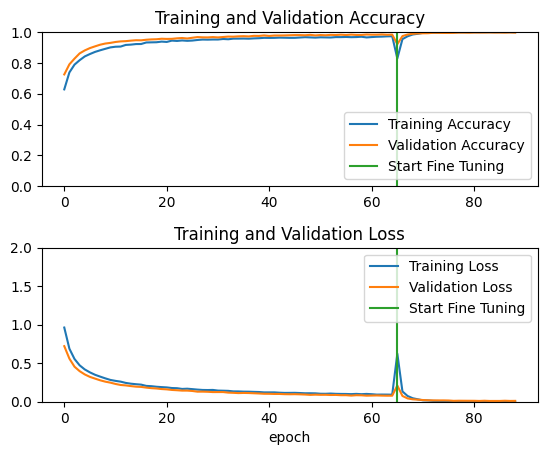

In [35]:
# Đồ thị Accuracy
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0, 1])
plt.plot([actual_initial_epochs, actual_initial_epochs], plt.ylim(), label='Start Fine Tuning')  # Đường chỉ điểm tại epoch thực tế
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

# Đồ thị Loss
plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 2.0])
plt.plot([actual_initial_epochs, actual_initial_epochs], plt.ylim(), label='Start Fine Tuning')  # Đường chỉ điểm tại epoch thực tế
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')

plt.subplots_adjust(hspace=0.4) 
plt.show()

## Evaluation and prediction

In [36]:
loss, accuracy = model.evaluate(test_dataset)
print('Test accuracy :', accuracy)

7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 424ms/step - accuracy: 1.0000 - loss: 0.0014
Test accuracy : 1.0


Predictions:
 [0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0
 0 0 1 0 1 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0
 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1
 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0
 0 0 1 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0
 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 1 0
 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0]
Labels:
 [[0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0.

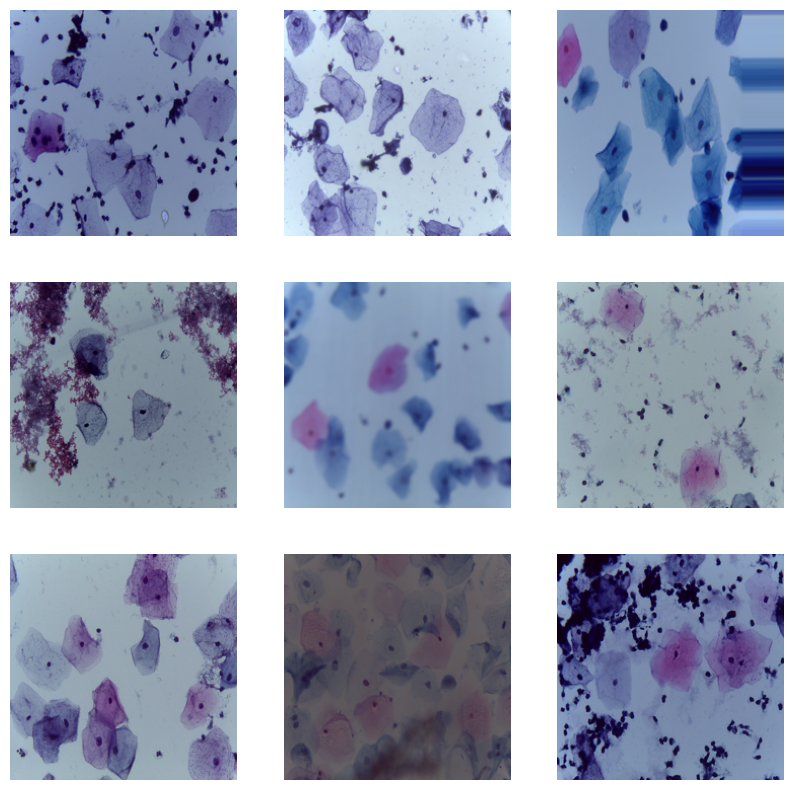

In [37]:
# Retrieve a batch of images from the test set
image_batch, label_batch = test_dataset.as_numpy_iterator().next()
predictions = model.predict_on_batch(image_batch).flatten()
predictions = tf.where(predictions < 0.5, 0, 1)

print('Predictions:\n', predictions.numpy())
print('Labels:\n', label_batch)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image_batch[i].astype("uint8"))
#   plt.title(class_names[predictions[i]])
  plt.axis("off")